This project is among Kaggle's competitions and participants were asked to predict the `loss` variable which stands for the cost of accidents and hence the severity of the insurance claims. In fact, each row in this dataset represents an insurance claim. The main challenge of this dataset is the abundance of features: 116 categorical features (variables that are prefaced with 'cat') and 14 continuous features (variables that are prefaced with 'cont'). 

For finding the data visit this [link](https://www.kaggle.com/competitions/allstate-claims-severity/data). The aim of this project is to build a model that can minimize the MAE metric. 

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy.stats import chi2_contingency


In [5]:
df = pd.read_csv("./Data/train.csv", index_col = "id")
df.head(5)

,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,...,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
id,,,,,,,,,,,,,,,,,,,,,
1,A,B,A,B,A,A,A,A,B,A,...,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
2,A,B,A,A,A,A,A,A,B,B,...,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
5,A,B,A,A,B,A,A,A,B,B,...,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
10,B,B,A,B,A,A,A,A,B,A,...,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
11,A,B,A,B,A,A,A,A,B,B,...,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85


In [3]:
df.shape

(188318, 131)

# Categorical features (cat1-cat116)

In [6]:
num_cat_columns = 0
for i in df.columns:
    if len(i.split("cat"))==2:
        num_cat_columns +=1

print("Number of categorical features:", num_cat_columns)
print("Number continuos features:", df.shape[1]- num_cat_columns)


Number of categorical features: 116
Number continuos features: 15


In [7]:
cat_features = {}
for i in range(0,116):
    cat_features[df.columns[i]] = "category"


df = df.astype(cat_features)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 188318 entries, 1 to 587633
Columns: 131 entries, cat1 to loss
dtypes: category(116), float64(15)
memory usage: 44.2 MB


In [6]:
l  =  [i for i in range(0,116) if i%8 ==0]
l.append(116)
for i in range(len(l)-1):
    print(df.iloc[:,l[i]:l[i+1]].describe())
    dash = "-"*75
    print(dash)

          cat1    cat2    cat3    cat4    cat5    cat6    cat7    cat8
count   188318  188318  188318  188318  188318  188318  188318  188318
unique       2       2       2       2       2       2       2       2
top          A       A       A       A       A       A       A       A
freq    141550  106721  177993  128395  123737  131693  183744  177274
---------------------------------------------------------------------------
          cat9   cat10   cat11   cat12   cat13   cat14   cat15   cat16
count   188318  188318  188318  188318  188318  188318  188318  188318
unique       2       2       2       2       2       2       2       2
top          A       A       A       A       A       A       A       A
freq    113122  160213  168186  159825  168851  186041  188284  181843
---------------------------------------------------------------------------
         cat17   cat18   cat19   cat20   cat21   cat22   cat23   cat24
count   188318  188318  188318  188318  188318  188318  188318  188

Let's check the frequency of categories:

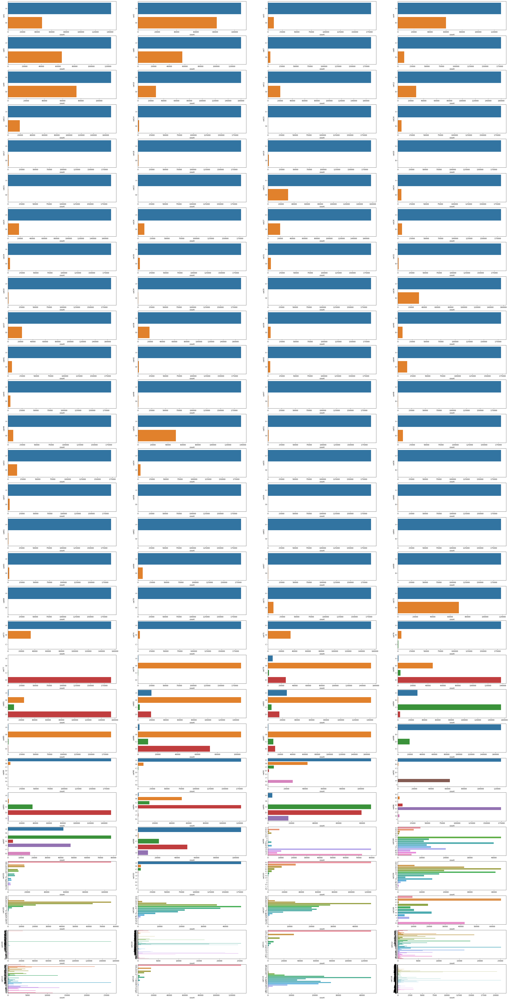

In [7]:
fig, ax = plt.subplots(29,4, figsize = (50,100))
for i in range(0,116):
    sns.countplot(data = df, y= df.columns[i], ax = ax[i//4, i%4])

Based on the above plots, we have to address two issues in categorical features before model training:

1. There are two-level categorical features where one of levels occurs rarely. 
2. There are features with a lot of levels in which some of these levels suffer from low frequency.

When we are going to encode categorical featus, we will deal with these two issues.

Let's figure out the mean of loss class within each of values for all categorical features:

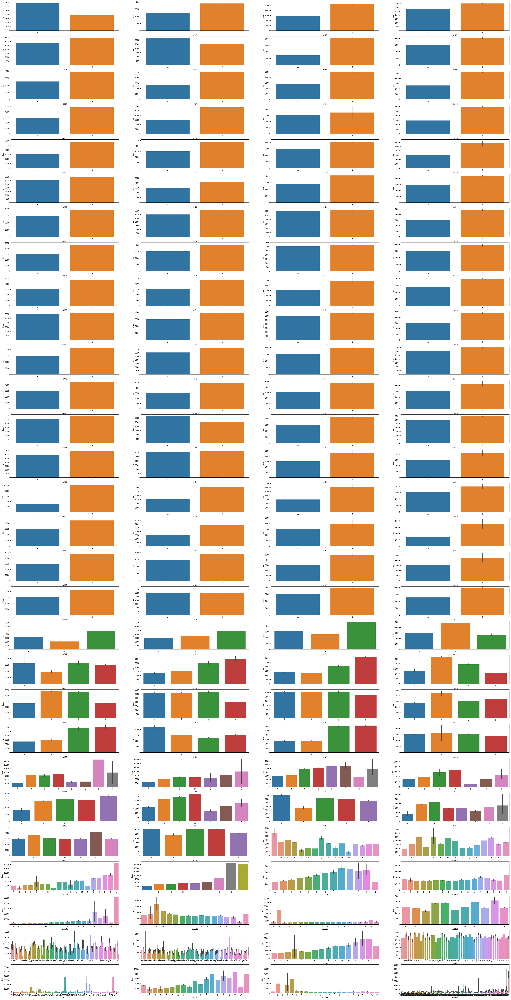

In [8]:
fig, ax = plt.subplots(29,4, figsize = (50,100))
for i in range(0,116):
    sns.barplot(data = df, x= df.columns[i], y = "loss", ax = ax[i//4, i%4])

## Correlation matrix between categorical features

Finding relationship between categorical features is not as straight forward as finding it between continuous features. But there are some techniques that can be applied and among them we choose Cramer' V. Cramer's V is a measure of association between two categorical variables. It is similar to the correlation coefficient for continuous variables, but it is designed to work with categorical data. Cramer's V ranges between 0 and 1, with values closer to 1 indicating a stronger association between the variables, and values closer to 0 indicating little or no association.

Cramer's V is calculated as the square root of the chi-squared statistic divided by the total sample size and the minimum of the number of rows or columns minus 1. The formula for Cramer's V is as follows:

```
V = sqrt(chi2 / (n * min(r - 1, c - 1)))
```
where chi2 is the chi-squared statistic, n is the total sample size, r is the number of rows in the contingency table, and c is the number of columns in the contingency table.

In [8]:

def cramers_v(x, y):
    crosstab = pd.crosstab(x, y)
    chi2, p, dof, expected = chi2_contingency(crosstab)
    n = crosstab.sum().sum()
    r, c = crosstab.shape
    v = np.sqrt(chi2 / (n * min(r - 1, c - 1)))
    return v

# Create a correlation matrix using Cramer's V
corr_matrix = pd.DataFrame(np.zeros((116, 116)), columns=df.columns[:116], index=df.columns[:116])
for i in range(116):
    for j in range(i,116):
        v = cramers_v(df.iloc[:, i], df.iloc[:, j])
        corr_matrix.iloc[i, j] = v
        corr_matrix.iloc[j, i] = v

#print(corr_matrix)

<AxesSubplot: >

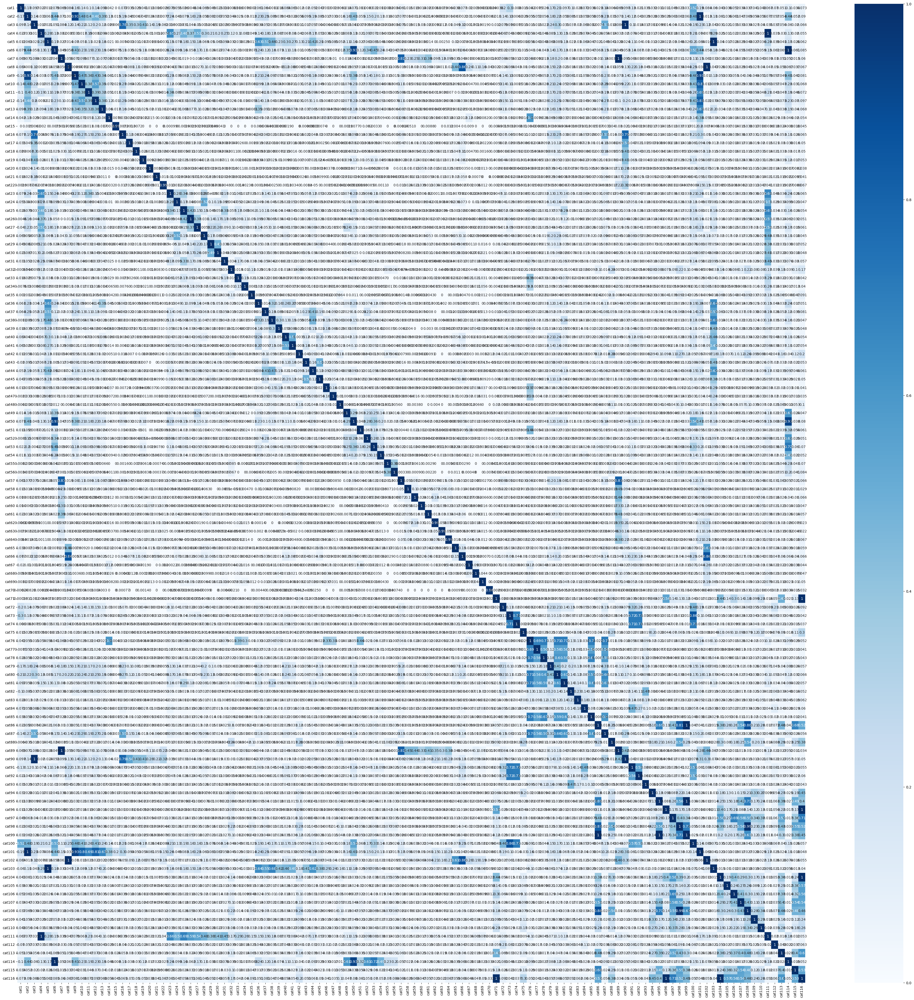

In [10]:
fig , ax = plt.subplots(figsize = (50,50))
sns.heatmap(corr_matrix, cmap="Blues", annot= True)

Based on the above matrix, there are some high-correlated features within this dataset. Let's find them using the `np.where` function which returns a tuple of two arrays, where the first array contains the row indices and the second array contains the column indices. We then create a list of columns that should better get removed. 

In [9]:
cat_remove = []
indices = np.where(corr_matrix > 0.9)
# Extract the pairs of features with correlation greater than 0.9
for i in range(len(indices[0])):
    row = indices[0][i]
    col = indices[1][i]
    if row < col:
        print(f"{df.columns[row]} and {df.columns[col]} have a correlation greater than 0.9")
        if df.columns[col] not in cat_remove:
            cat_remove.append(df.columns[col])

print(cat_remove)

cat2 and cat9 have a correlation greater than 0.9
cat2 and cat101 have a correlation greater than 0.9
cat3 and cat90 have a correlation greater than 0.9
cat4 and cat111 have a correlation greater than 0.9
cat5 and cat103 have a correlation greater than 0.9
cat6 and cat50 have a correlation greater than 0.9
cat6 and cat114 have a correlation greater than 0.9
cat7 and cat89 have a correlation greater than 0.9
cat8 and cat102 have a correlation greater than 0.9
cat9 and cat101 have a correlation greater than 0.9
cat50 and cat114 have a correlation greater than 0.9
cat71 and cat116 have a correlation greater than 0.9
cat86 and cat99 have a correlation greater than 0.9
cat95 and cat99 have a correlation greater than 0.9
cat96 and cat116 have a correlation greater than 0.9
cat98 and cat108 have a correlation greater than 0.9
cat104 and cat116 have a correlation greater than 0.9
['cat9', 'cat101', 'cat90', 'cat111', 'cat103', 'cat50', 'cat114', 'cat89', 'cat102', 'cat116', 'cat99', 'cat108']


In [10]:
cat_features_in = [i for i in df.columns[:116] if i not in cat_remove]

# Continuous features

In [13]:
df.describe()

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
mean,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,0.187640,0.207202,0.202105,0.211292,0.209027,0.205273,0.178450,0.199370,0.181660,0.185877,0.209737,0.209427,0.212777,0.222488,2904.086186
min,0.000016,0.001149,0.002634,0.176921,0.281143,0.012683,0.069503,0.236880,0.000080,0.000000,0.035321,0.036232,0.000228,0.179722,0.670000
25%,0.346090,0.358319,0.336963,0.327354,0.281143,0.336105,0.350175,0.312800,0.358970,0.364580,0.310961,0.311661,0.315758,0.294610,1204.460000
50%,0.475784,0.555782,0.527991,0.452887,0.422268,0.440945,0.438285,0.441060,0.441450,0.461190,0.457203,0.462286,0.363547,0.407403,2115.570000
75%,0.623912,0.681761,0.634224,0.652072,0.643315,0.655021,0.591045,0.623580,0.566820,0.614590,0.678924,0.675759,0.689974,0.724623,3864.045000
max,0.984975,0.862654,0.944251,0.954297,0.983674,0.997162,1.000000,0.980200,0.995400,0.994980,0.998742,0.998484,0.988494,0.844848,121012.250000


In [14]:
df.iloc[:,116:].isnull().sum()

cont1     0
cont2     0
cont3     0
cont4     0
cont5     0
cont6     0
cont7     0
cont8     0
cont9     0
cont10    0
cont11    0
cont12    0
cont13    0
cont14    0
loss      0
dtype: int64

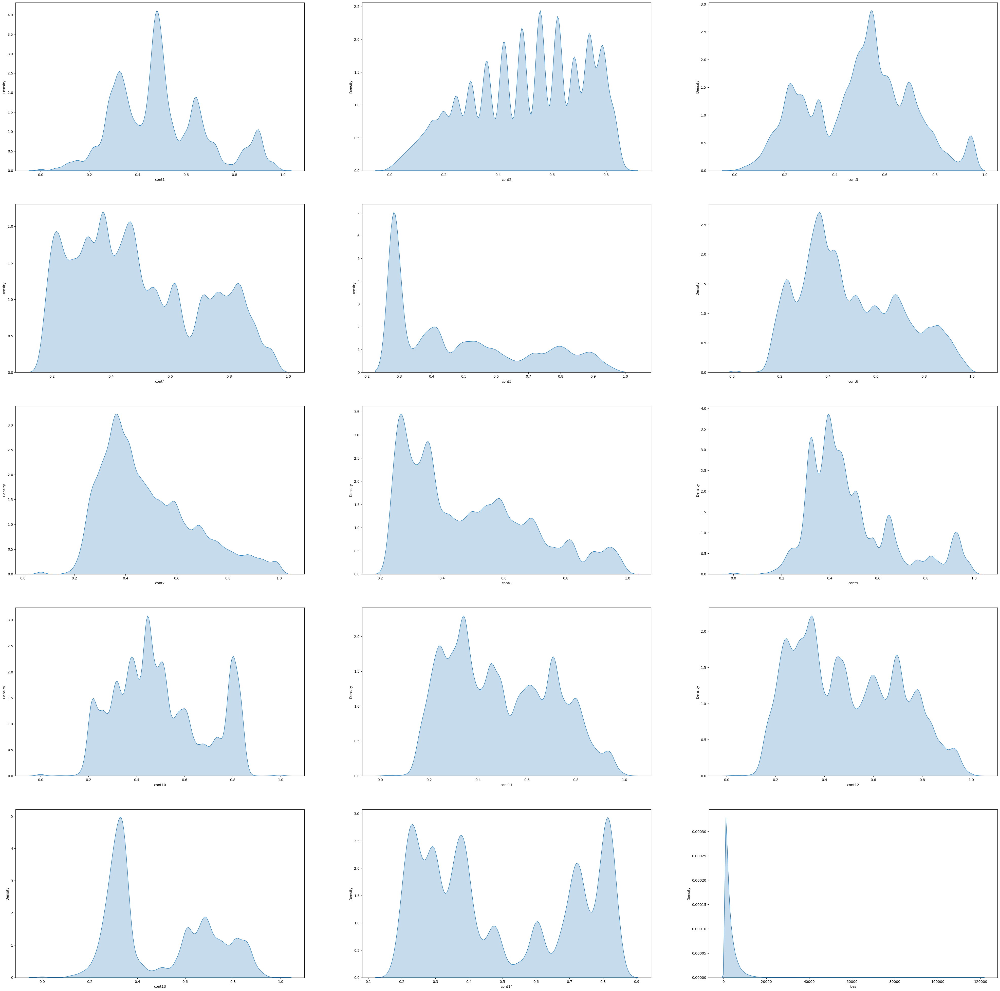

In [15]:
cont_features = df.columns[116:]

fig, ax = plt.subplots(5,3, figsize = (50, 50))

for i in range(len(cont_features)):
    sns.kdeplot(data = df, x = df[cont_features[i]], ax = ax[i//3, i%3], fill = True)

<AxesSubplot: >

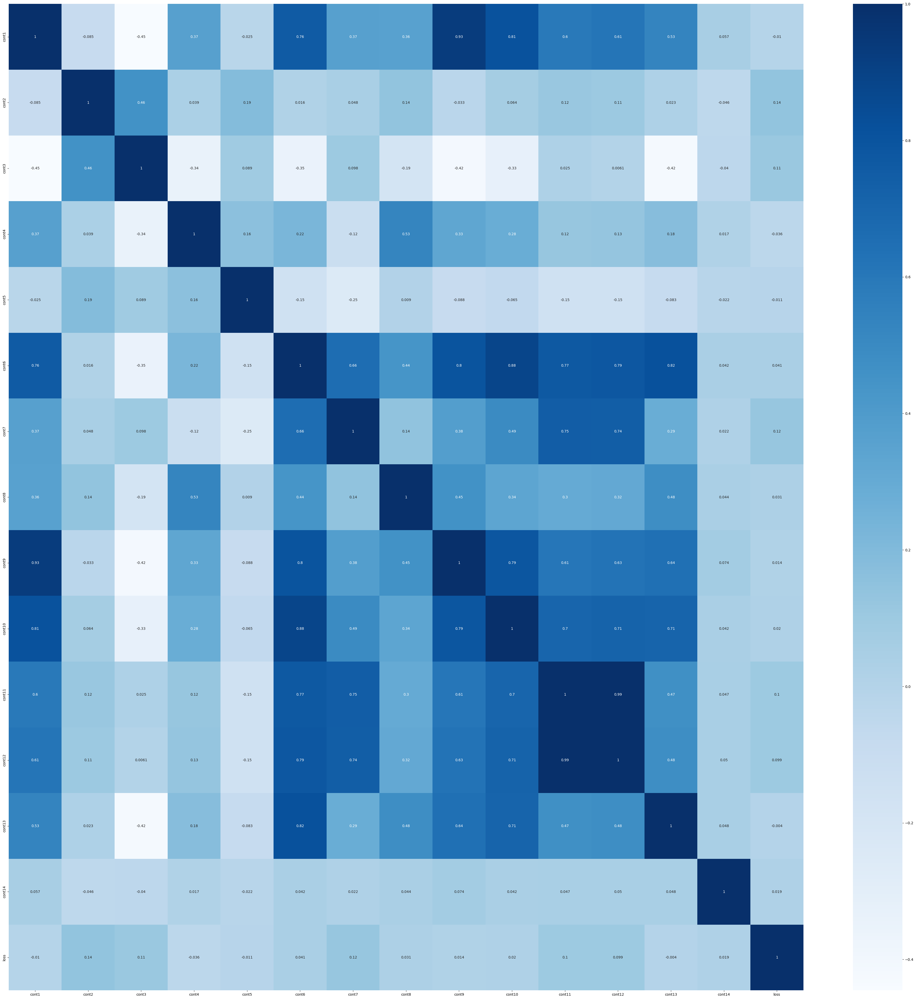

In [16]:
corr_matrix = df.iloc[:, 116:].corr()
fig , ax = plt.subplots(figsize = (50,50))
sns.heatmap(corr_matrix, cmap="Blues", annot= True)

Since there are correlated features in the dataset, let's find the most correlated ones and exclude them:

In [9]:


for i in range(1,15):
    j =i+1
    while j<13:
        corr = df[["cont"+str(i), "cont"+str(j)]].corr().iloc[0,1]
        if abs(corr) >.75:
            print(f"cont{i} has high correlation ({corr}) with cont{j}")
        j +=1


cont1 has high correlation (0.7583153164367251) with cont6
cont1 has high correlation (0.9299117057620868) with cont9
cont1 has high correlation (0.808550869433555) with cont10
cont6 has high correlation (0.7975435189948881) with cont9
cont6 has high correlation (0.8833505068489653) with cont10
cont6 has high correlation (0.7737454535517788) with cont11
cont6 has high correlation (0.7851439724373066) with cont12
cont9 has high correlation (0.7856967914962641) with cont10
cont11 has high correlation (0.9943841100222036) with cont12


In [11]:
cont_remove = ["cont9", "cont10", "cont12"]
cont_features_in = [i for i in df.columns[116:-1] if i not in cont_remove]
print(len(cont_features_in))

11


# Preprocessing

In [12]:
from sklearn.preprocessing import quantile_transform
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, TargetEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


In [14]:
X = df.iloc[:, :-1]
y = df["loss"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25)

y_train_nm = np.log(y_train)
y_test_nm = np.log(y_test)


In [15]:
print(df.shape)
print(X_train.shape)
print(X_test.shape)


(188318, 131)
(141238, 130)
(47080, 130)


## Encoding categorical features

### OneHot Encoding

In [16]:
# Convert categorical feature to numerical features using one-hot encoding
onehot_encoder = OneHotEncoder(handle_unknown= 'infrequent_if_exist', min_frequency= 0.005)#we need to set these paremters to handle low frequnct levels

onehot_encoder.fit(X_train[cat_features_in])
onehot_encoded_train = onehot_encoder.transform(X_train[cat_features_in])
onehot_encoded_test = onehot_encoder.transform(X_test[cat_features_in])

# Convert the encoded features to a DataFrame
onehot_train_df= pd.DataFrame(onehot_encoded_train.toarray(), columns=onehot_encoder.get_feature_names_out(cat_features_in), index = X_train.index)
onehot_test_df = pd.DataFrame(onehot_encoded_test.toarray(),columns=onehot_encoder.get_feature_names_out(cat_features_in), index = X_test.index )
# Concatenate the original DataFrame with the one-hot encoded DataFrame
onehot_train_df

,cat1_A,cat1_B,cat2_A,cat2_B,cat3_A,cat3_B,cat4_A,cat4_B,cat5_A,cat5_B,...,cat115_J,cat115_K,cat115_L,cat115_M,cat115_N,cat115_O,cat115_P,cat115_Q,cat115_R,cat115_infrequent_sklearn
id,,,,,,,,,,,,,,,,,,,,,
260855,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
571383,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
466508,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
210890,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
344030,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367759,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
575315,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
206241,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


### Target Encoding

This technique replaces each category with the mean target value for that category.

In [17]:
target_encoder = TargetEncoder()

target_encoder.fit(X_train[cat_features_in], y_train_nm)
target_encoded_train = target_encoder.transform(X_train[cat_features_in])
target_encoded_test = target_encoder.transform(X_test[cat_features_in])

# Convert the encoded features to a DataFrame
target_train_df= pd.DataFrame(target_encoded_train, columns=cat_features_in, index = X_train.index)
target_test_df = pd.DataFrame(target_encoded_test,columns=cat_features_in, index = X_test.index )
# Concatenate the original DataFrame with the one-hot encoded DataFrame
target_test_df

,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat10,cat11,...,cat100,cat104,cat105,cat106,cat107,cat109,cat110,cat112,cat113,cat115
id,,,,,,,,,,,,,,,,,,,,,
233458,7.807129,7.929939,7.645834,7.615331,7.832089,7.773065,7.657301,7.664534,8.266206,7.617035,...,8.031127,7.673773,7.654200,7.798598,7.687206,7.704482,7.778977,7.497372,7.635997,7.664519
126264,7.310699,7.495516,7.645834,7.830254,7.606439,7.773065,7.657301,7.664534,7.581671,7.617035,...,7.748358,7.671701,7.654200,7.649643,7.615502,7.614757,7.667245,7.654079,7.504301,7.690760
312150,7.310699,7.929939,7.645834,7.615331,7.606439,7.773065,7.657301,7.664534,7.581671,7.617035,...,7.329062,7.724570,7.715122,7.798598,7.687206,7.704482,7.714873,7.459477,7.874264,7.686703
309019,7.807129,7.929939,7.645834,7.615331,7.606439,7.773065,7.657301,7.664534,8.266206,7.617035,...,8.031127,7.693500,7.654200,7.654795,7.732787,7.488997,7.700066,7.754022,7.631471,7.675247
115134,7.310699,7.495516,7.645834,7.830254,7.606439,7.476384,7.657301,7.664534,7.581671,7.617035,...,7.215201,7.690217,7.654200,7.649643,7.652392,7.704482,7.705191,7.459477,7.646396,7.677107
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
487358,7.310699,7.495516,7.645834,7.615331,7.832089,7.773065,7.657301,7.664534,7.581671,7.617035,...,7.329062,7.673773,7.565921,7.649643,7.687206,7.704482,7.700066,7.497372,7.728282,7.664506
441202,7.807129,7.495516,7.645834,7.615331,7.606439,7.476384,7.657301,7.664534,7.581671,7.617035,...,7.329062,7.610916,7.695791,7.649643,7.656694,7.704482,7.668817,7.835765,7.601547,7.723996
453390,7.310699,7.495516,7.645834,7.615331,7.606439,7.476384,7.657301,7.664534,7.581671,7.617035,...,7.802022,7.671701,7.654200,7.704491,7.652392,7.614757,7.643185,7.727879,7.578123,7.664519


##  Scaling continuous features

### StandardScalar

In [18]:
# Normalize the features using StandardScaler
scaler = StandardScaler()
scaler.fit(X_train.iloc[:, 116:])

scaler_train = scaler.transform(X_train.iloc[:, 116:])
scaler_test = scaler.transform(X_test.iloc[:, 116:])
#X_train_norm = scaler.fit_transform(df.iloc[:,116:-1])
#X_test_norm = scaler.transform(X_test)

scaler_train_df = pd.DataFrame(scaler_train, columns = X_train.columns[116:], index = X_train.index )
scaler_test_df = pd.DataFrame(scaler_test, columns = X_test.columns[116:], index = X_test.index )

### Quantile transformation

Quantile Transformation is a non-linear transformation technique that maps the original data to a *uniform* or a *normal distribution*. This is done by ranking the data in ascending order and then replacing each data point with its corresponding percentile value.

### Map data to normal distribution

In [19]:
normal_train = {}
normal_test = {}
for name in X_train.columns[116:]:
    # Reshape the data to have two dimensions
    data = np.array(X_train[name]).reshape(-1, 1)
    # perform the transformation on train data: map to normal distribution
    transformed_data = quantile_transform(data, n_quantiles=100, random_state=0, output_distribution='normal')
    normal_train[name] = transformed_data.ravel()
    # perform the transformation on test data: map to normal distribution
    data = np.array(X_test[name]).reshape(-1, 1)
    transformed_data = quantile_transform(data, n_quantiles=100, random_state=0, output_distribution='normal')
    normal_test[name] = transformed_data.ravel()


normal_train_df = pd.DataFrame(normal_train, index=X_train.index)
normal_test_df = pd.DataFrame(normal_test, index=X_test.index)


In [27]:
normal_train_df

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
id,,,,,,,,,,,,,,
87360,-0.326427,0.666564,1.549706,-1.051717,-5.199338,-0.143980,0.630293,-0.650837,-0.412310,0.139710,-0.004231,-0.050671,-0.834427,-0.425900
11548,0.622077,0.403108,1.470545,-1.120205,-5.199338,0.673738,2.345357,-0.242903,0.776182,0.458679,1.893010,2.174754,-0.178175,0.682095
293350,-1.399657,-1.549706,0.050661,0.101452,0.781903,-2.099122,-1.940028,-1.807354,-2.190550,-1.876359,-1.578648,-1.665113,-1.708752,0.264925
151546,-0.326427,-1.073988,-0.544847,-1.399657,-5.199338,-0.536080,-1.306242,-1.194396,-0.501298,-0.076032,-0.955478,-0.967496,-1.335178,-1.056539
352574,-0.987837,2.049594,0.559592,-0.101452,1.718778,-1.083020,0.127205,-0.321971,-0.682458,-1.008673,-2.049594,-2.049594,-0.987837,1.164805
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220696,0.037988,-1.304923,-0.375793,-0.967422,0.025322,-0.967478,-0.452777,-1.194396,-0.362241,-0.589456,-0.927754,-0.927754,-0.731217,0.472078
453244,-2.244987,-1.304923,-0.191052,-0.731217,-0.282278,-0.796519,1.478956,0.216904,-2.372681,-1.434589,0.165327,0.139710,-2.372118,-0.405222
108872,-0.403108,2.049594,1.335178,1.220640,0.416878,0.467716,0.509050,1.816724,0.321971,0.799083,0.698526,1.029957,0.430727,-0.058218


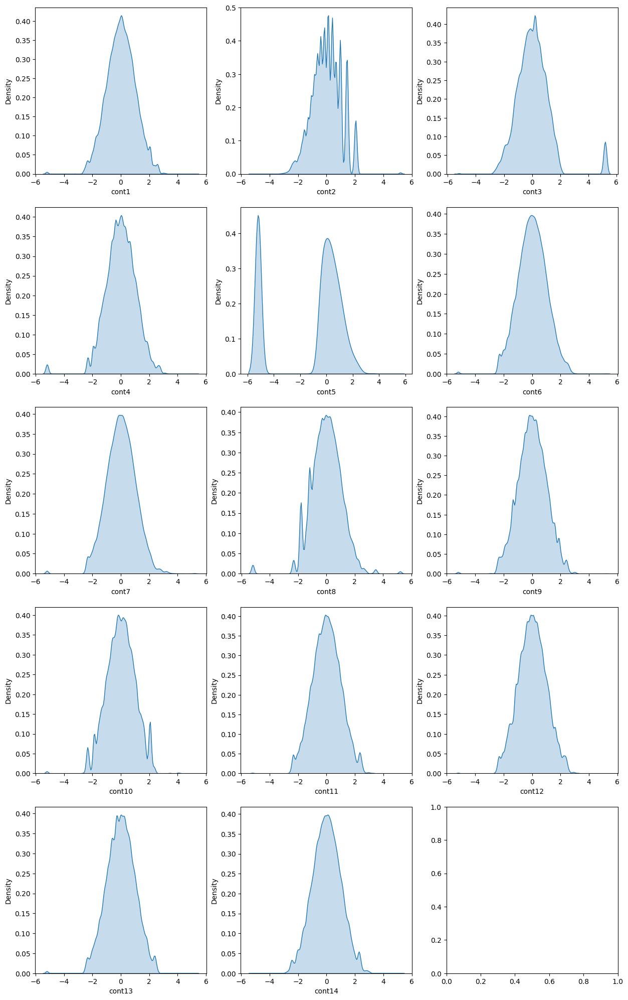

In [28]:
fig, ax = plt.subplots(5,3, figsize=(15,25))
for ind, name in enumerate(normal_train_df.columns):
    sns.kdeplot(data = normal_train_df, x = name, fill = True, ax = ax[ind//3, ind%3])

### Map data to uniform distribution

In [20]:
uniform_train = {}
uniform_test = {}
for name in X_train.columns[116:]:
    # Reshape the data to have two dimensions
    data = np.array(X_train[name]).reshape(-1, 1)
    # perform the transformation on train data: map to unifrm distribution
    transformed_data = quantile_transform(data, n_quantiles=100, random_state=0, output_distribution='uniform')
    uniform_train[name] = transformed_data.ravel()
    # perform the transformation on test data: map to unifrom distribution
    data = np.array(X_test[name]).reshape(-1, 1)
    transformed_data = quantile_transform(data, n_quantiles=100, random_state=0, output_distribution='uniform')
    uniform_test[name] = transformed_data.ravel()


uniform_train_df = pd.DataFrame(uniform_train, index=X_train.index)
uniform_test_df = pd.DataFrame(uniform_test, index=X_test.index)

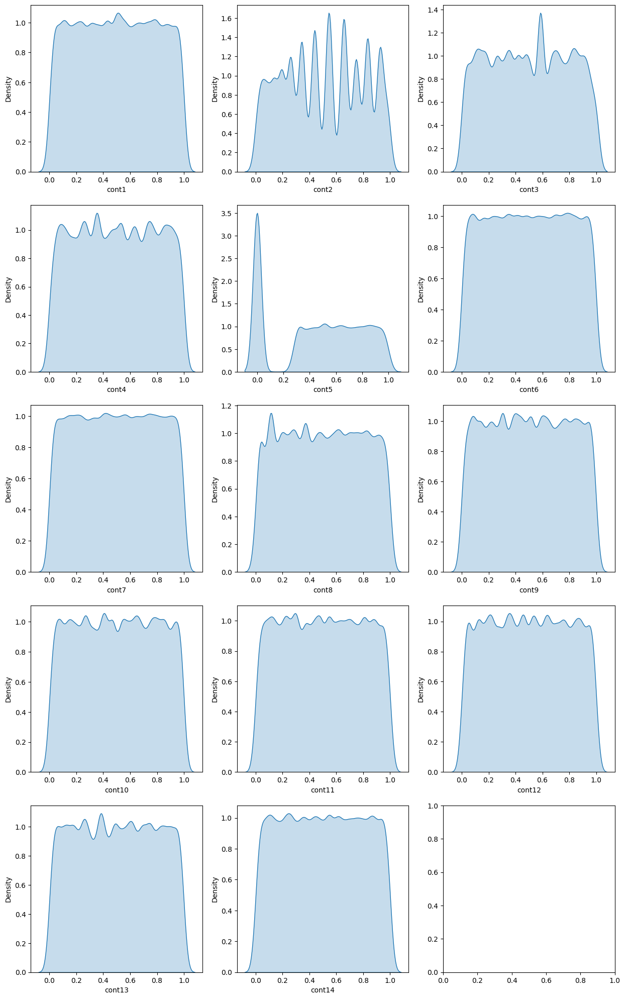

In [30]:
fig, ax = plt.subplots(5,3, figsize=(15,25))
for ind, name in enumerate(uniform_train_df.columns):
    sns.kdeplot(data = uniform_train_df, x = name, fill = True, ax = ax[ind//3, ind%3])

## PCA

In [21]:
pca_comp = 7
pca = PCA(n_components=pca_comp)

columns_pca_df = ["pca"+str(i+1) for i in range(pca_comp)]

pca.fit(X_train.iloc[:, 116:])
# Fit the PCA model to the data and transform the data to the new feature space
pca_train = pca.transform(X_train.iloc[:, 116:])
pca_test = pca.transform(X_test.iloc[:, 116:])

pca_train_df = pd.DataFrame(pca_train, columns=columns_pca_df, index = X_train.index)
pca_test_df = pd.DataFrame(pca_test, columns=columns_pca_df, index = X_test.index )
print(pca.explained_variance_ratio_.sum())

0.9233228721872532


In [22]:
pca_test_df

,pca1,pca2,pca3,pca4,pca5,pca6,pca7
id,,,,,,,
531646,-0.320797,0.369732,0.064993,0.132123,-0.122796,-0.154754,0.248997
454279,0.923996,-0.440510,-0.114163,0.140776,-0.204912,-0.120500,0.279086
244684,0.388637,0.458957,0.231762,-0.239871,-0.089259,-0.130678,0.096365
522233,-0.791458,-0.080169,-0.450866,0.261699,0.125057,0.008924,-0.158720
582191,0.002399,-0.206081,-0.302936,-0.084254,-0.003727,0.238587,0.223140
...,...,...,...,...,...,...,...
484552,-0.242588,0.338524,0.601491,-0.190084,-0.225039,0.070716,-0.072983
240755,-0.566106,0.120056,-0.242649,0.305412,0.053596,-0.183341,0.200466
464297,-0.715978,-0.085999,-0.249025,-0.173584,0.102517,-0.029291,0.063692


## Creating test and train DataFrame based on above preprocessing 

In [22]:
#without any preprocessing on all of continuous features
X_train1 = onehot_train_df.merge(X_train.iloc[:, 116:], how = 'left',on = "id")
X_test1 = onehot_test_df.merge(X_test.iloc[:, 116:], how = 'left',on = "id")

#without any preprocessing, just include count_features_in
X_train2 = onehot_train_df.merge(X_train[cont_features_in], how = 'left',on = "id") 
X_test2 = onehot_test_df.merge(X_test[cont_features_in], how = 'left',on = "id") 


X_train3 = onehot_train_df.merge(scaler_train_df[cont_features_in], how = 'left',on = "id" ) 
X_test3 = onehot_test_df.merge(scaler_test_df[cont_features_in], how = 'left',on = "id" )


X_train4 = onehot_train_df.merge(normal_train_df[cont_features_in], how = "left", on = "id") 
X_test4 = onehot_test_df.merge(normal_test_df[cont_features_in], how = "left", on = "id") 

X_train5 = onehot_train_df.merge(uniform_train_df[cont_features_in], how = "left", on = "id") 
X_test5 = onehot_test_df.merge(uniform_test_df[cont_features_in], how = "left", on = "id")

X_train6 = onehot_train_df.merge(pca_train_df, how = "left", on = "id")
X_test6 = onehot_test_df.merge(pca_test_df, how = "left", on = "id")

#without any preprocessing on all of continuous features
X_train01 = target_train_df.merge(X_train.iloc[:, 116:], how = 'left',on = "id")
X_test01 = target_test_df.merge(X_test.iloc[:, 116:], how = 'left',on = "id")

#without any preprocessing, just include count_features_in
X_train02 = target_train_df.merge(X_train[cont_features_in], how = 'left',on = "id") 
X_test02 = target_test_df.merge(X_test[cont_features_in], how = 'left',on = "id") 


X_train03 = target_train_df.merge(scaler_train_df[cont_features_in], how = 'left',on = "id" ) 
X_test03 = target_test_df.merge(scaler_test_df[cont_features_in], how = 'left',on = "id" )


X_train04 = target_train_df.merge(normal_train_df[cont_features_in], how = "left", on = "id") 
X_test04 = target_test_df.merge(normal_test_df[cont_features_in], how = "left", on = "id") 

X_train05 = target_train_df.merge(uniform_train_df[cont_features_in], how = "left", on = "id") 
X_test05 = target_test_df.merge(uniform_test_df[cont_features_in], how = "left", on = "id")

X_train06 = target_train_df.merge(pca_train_df, how = "left", on = "id")
X_test06 = target_test_df.merge(pca_test_df, how = "left", on = "id")



X_train_list = [X_train1, X_train2, X_train3, X_train4, X_train5, X_train6, X_train01, X_train02, X_train03, X_train04, X_train05, X_train06]
X_test_list = [X_test1, X_test2, X_test3, X_test4, X_test5, X_test6, X_test01, X_test02, X_test03, X_test04, X_test05, X_test06 ]

y_train_nm = np.log(y_train)
y_test_nm = np.log(y_test)

y_train_nm_shift = np.log(y_train +200)
y_test_nm_shift = np.log(y_test +200)



### The Effect of normalization techniques on the target feature

Text(0.5, 1.0, 'Log(y+200)')

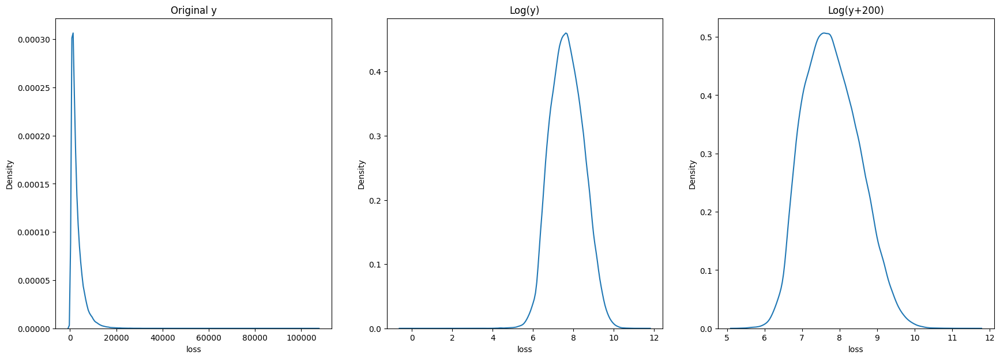

In [56]:
fig, ax = plt.subplots(1,3, figsize = (21,7))

sns.kdeplot(x = y_train, ax = ax[0])
ax[0].set_title("Original y")

sns.kdeplot(x = y_train_nm, ax = ax[1])
ax[1].set_title("Log(y)")

sns.kdeplot(x = y_train_nm_shift, ax = ax[2])
ax[2].set_title("Log(y+200)")

# Model training

In [ ]:
from xgboost import XGBRegressor
import xgboost as xgb
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
import time
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

## Xgboost

In [52]:
import time
xgb = XGBRegressor(max_depth=12, 
        learning_rate=0.02, 
        subsample=0.8,
        colsample_bytree=0.4, 
        eval_metric= 'mae',
        n_estimators=1000 )

#xgb_mae_score = []
xgb_mae_score_y_nm = []

for i in range(0,11):
        start = time.time()
        eval_set = [(X_test_list[i], y_test_nm)]
        xgb.fit(X_train_list[i], y_train_nm, eval_set=eval_set, verbose=False, early_stopping_rounds=10)
        y_hat = np.exp(xgb.predict(X_test_list[i]))
        xgb_mae_score_y_nm.append(mean_absolute_error(y_test, y_hat))
        end = time.time()
        print(end-start)
        print(xgb_mae_score_y_nm)
        print("---------------------------")

#print("XGBoost score without normalizing y:", xgb_mae_score)
print("XGBoost score with normalizing y:", xgb_mae_score_y_nm)

c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


174.58712697029114
[1151.1980672793327]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


178.30399298667908
[1151.1980672793327, 1149.6657891981047]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


177.85107684135437
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


166.02012872695923
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


180.40757608413696
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


196.544429063797
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145, 1159.4447934113196]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


62.706603050231934
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145, 1159.4447934113196, 1152.6163388481043]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


71.13477492332458
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145, 1159.4447934113196, 1152.6163388481043, 1151.2332386293112]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


81.3893358707428
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145, 1159.4447934113196, 1152.6163388481043, 1151.2332386293112, 1150.0367484963158]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


59.19140148162842
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145, 1159.4447934113196, 1152.6163388481043, 1151.2332386293112, 1150.0367484963158, 1154.822535663407]
---------------------------


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


57.40188980102539
[1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145, 1159.4447934113196, 1152.6163388481043, 1151.2332386293112, 1150.0367484963158, 1154.822535663407, 1154.1708864151299]
---------------------------
XGBoost score with normalizing y: [1151.1980672793327, 1149.6657891981047, 1150.0323358060436, 1151.0776490497444, 1151.2386734256145, 1159.4447934113196, 1152.6163388481043, 1151.2332386293112, 1150.0367484963158, 1154.822535663407, 1154.1708864151299]


### Dmatrix

`DMatrix`` is a data structure used to store the dataset during the training and evaluation processes in XGBosst. It is a specific data format optimized for efficiency and compatibility with XGBoost's algorithms.

In the following, we will use this XGBoost data structure for training XGBoost models.

In [53]:
selected_train_df = [X_train01, X_train1, X_train03, X_train3]
selected_test_df = [X_test01, X_test1, X_test03, X_test3]

mae_score = []
train_time=[]

for i in range(len(selected_train_df)):

    D_train = xgb.DMatrix(selected_train_df[i], label=y_train_nm)
    D_test = xgb.DMatrix(selected_test_df[i], label=y_test_nm)

    # Define XGBoost parameters
    param = {
        'min_child_weight': 1,
        'eta' : 0.03,
        'colsample_bytree': 0.5,
        'max_depth' : 6,
        'subsample' : 0.8,
        'alpha': .3,
        'gamma' : 0,
        'eval_metric': 'mae',
        'learning_rate' : 0.01
        } 


    steps = 5000  # The number of training iterations
    print(f"Model training on dataframe {i} started")
    start = time.time()
    # Train the model
    model = xgb.train(param, D_train, steps)
    end = time.time()
    # Predict the value of the test data
    preds = model.predict(D_test)
    print("train done")

    y_hat = np.exp(preds)
    train_time.append(end-start)
    mae_score.append(mean_absolute_error(y_test, y_hat))

print("MAE:", mae_score)
print("training time:", train_time)



Model training on dataframe 0 started
train done
Model training on dataframe 1 started
train done
Model training on dataframe 2 started
train done
Model training on dataframe 3 started
train done
MAE: [1144.6680995668526, 1144.7807192515306, 1144.5755574921095, 1145.150956946024]
training time: [280.460289478302, 677.2209806442261, 283.0177278518677, 649.7557225227356]


In [31]:

mae_score = []
train_time=[]

def logregobj(preds, dtrain):
    labels = dtrain.get_label()
    con =2
    x =preds-labels
    grad =con*x / (np.abs(x)+con)
    hess =con**2 / (np.abs(x)+con)**2
    return grad, hess 


def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'mae', mean_absolute_error(np.exp(preds), np.exp(labels))

for i in range(len(selected_train_df)):

    D_train = xgb.DMatrix(selected_train_df[i], label=y_train_nm)
    D_test = xgb.DMatrix(selected_test_df[i], label=y_test_nm)

    # Define XGBoost parameters
    param = {
        'min_child_weight': 1,
        'eta' : 0.03,
        'colsample_bytree': 0.5,
        'max_depth' : 6,
        'subsample' : 0.8,
        'alpha': .3,
        'gamma' : 0,
        'eval_metric': 'mae',
        'learning_rate' : 0.01
        } 

    steps = 5000  # The number of training iterations


    start = time.time()
    # Train the model
    model = xgb.train(param, D_train, steps, obj=logregobj,feval=evalerror)# num_boost_round=cv_results['test-mae-mean'].argmin(), 
    end = time.time()
    # Predict the value of the test data
    preds = model.predict(D_test)
    print("train done")

    y_hat = np.exp(preds)
    train_time.append(end-start)
    mae_score.append(mean_absolute_error(y_test, y_hat))

print("MAE:", mae_score)
print("training time:", train_time)



c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done
MAE: [1142.5472215813675, 1144.7240274943672, 1142.8748242354218]
training time: [272.2019760608673, 682.2566437721252, 279.3815186023712]


In [32]:
mae_score = []
train_time=[]

def differentiable_obj(preds, dtrain):
    labels = dtrain.get_label()
    c = 20
    m = 4
    x = preds-labels
    grad = m*x/np.sqrt(x**2 +c**2)
    hess = m*c**2/(np.sqrt(x**2 +c**2))**3
    return grad, hess 


def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'mae', mean_absolute_error(np.exp(preds), np.exp(labels))

for i in range(len(selected_train_df)):

    D_train = xgb.DMatrix(selected_train_df[i], label=y_train_nm)
    D_test = xgb.DMatrix(selected_test_df[i], label=y_test_nm)

    # Define XGBoost parameters
    param = {
        'min_child_weight': 1,
        'eta' : 0.03,
        'colsample_bytree': 0.5,
        'max_depth' : 6,
        'subsample' : 0.8,
        'alpha': .3,
        'gamma' : 0,
        'eval_metric': 'mae',
        'learning_rate' : 0.01
        } 

    steps = 5000  # The number of training iterations

    
    start = time.time()
    # Train the model
    model = xgb.train(param, D_train,steps, obj=differentiable_obj,feval=evalerror)
    end = time.time()
    # Predict the value of the test data
    preds = model.predict(D_test)
    print("train done")

    y_hat = np.exp(preds)
    train_time.append(end-start)
    mae_score.append(mean_absolute_error(y_test, y_hat))

print("MAE:", mae_score)
print("training time:", train_time)



c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done
MAE: [1144.356868206144, 1145.4197128868916, 1144.957155360375]
training time: [283.41746520996094, 680.909560918808, 281.5250642299652]


In [34]:
# Convert the training and testing sets into DMatrixes

selected_train_df = [X_train01, X_train1, X_train03,]
selected_test_df = [X_test01, X_test1, X_test03,]

mae_score = []
train_time=[]

def logregobj(preds, dtrain):
    labels = dtrain.get_label()
    con =2
    x =preds-labels
    grad =con*x / (np.abs(x)+con)
    hess =con**2 / (np.abs(x)+con)**2
    return grad, hess 


def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'mae', mean_absolute_error(np.exp(preds), np.exp(labels))

for i in range(len(selected_train_df)):

    D_train = xgb.DMatrix(selected_train_df[i], label=y_train_nm)
    D_test = xgb.DMatrix(selected_test_df[i], label=y_test_nm)

    # Define XGBoost parameters
    RANDOM_STATE = 2016

    params = {
        'min_child_weight': 1,
        'eta': 0.03,
        'colsample_bytree': 0.5,
        'max_depth': 12,
        'subsample': 0.8,
        'alpha': 1,
        'gamma': 1.5,
        'silent': 1,
        'verbose_eval': True,
        'seed': RANDOM_STATE,
        'nthread':7,
        'base_score':7.76
    }

    steps = 5000  # The number of training iterations


    
    start = time.time()
    # Train the model
    model = xgb.train(param, D_train, steps, obj=logregobj,feval=evalerror)
    end = time.time()
    # Predict the value of the test data
    preds = model.predict(D_test)
    print("train done")

    y_hat = np.exp(preds)
    train_time.append(end-start)
    mae_score.append(mean_absolute_error(y_test, y_hat))

print("MAE:", mae_score)
print("training time:", train_time)




c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


train done
MAE: [1142.5472215813675, 1144.7240274943672, 1142.8748242354218]
training time: [338.7689678668976, 719.9649114608765, 273.4859755039215]


In [41]:
selected_train_df = [X_train01]
selected_test_df = [X_test01]

mae_score = []
train_time=[]

def logregobj(preds, dtrain):
    labels = dtrain.get_label()
    con =2
    x =preds-labels
    grad =con*x / (np.abs(x)+con)
    hess =con**2 / (np.abs(x)+con)**2
    return grad, hess 


def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'mae', mean_absolute_error(np.exp(preds), np.exp(labels))

for i in range(len(selected_train_df)):


    D_train = xgb.DMatrix(selected_train_df[i], label=y_train_nm_shift)
    D_test = xgb.DMatrix(selected_test_df[i], label=y_test_nm_shift)

    # Define XGBoost parameters
    RANDOM_STATE = 2016

    params = {
        'min_child_weight': 1,
        'eta': 0.03,
        'colsample_bytree': 0.5,
        'max_depth': 12,
        'subsample': 0.8,
        'alpha': 1,
        'gamma': 1.5,
        'silent': 1,
        'verbose_eval': True,
        'seed': RANDOM_STATE,
        'nthread':7,
        'base_score':7.76
    }

    steps = 5000  # The number of training iterations

    
    start = time.time()
    # Train the model
    model = xgb.train(param, D_train, steps, obj=logregobj,feval=evalerror)
    end = time.time()
    # Predict the value of the test data
    preds = model.predict(D_test)
    print("train done")

    y_hat = np.exp(preds)-200
    train_time.append(end-start)
    mae_score.append(mean_absolute_error(y_test, y_hat))

print("MAE:", mae_score)
print("training time:", train_time)




train done
MAE: [1141.734835646429]
training time: [274.789222240448]


In [47]:
# Changing parameters of the second model+ shift the y_nm +watchlist+steps+ learning rate


# Convert the training and testing sets into DMatrixes

selected_train_df = [X_train01]
selected_test_df = [X_test01]

mae_score = []
train_time=[]

def logregobj(preds, dtrain):
    labels = dtrain.get_label()
    con =2
    x =preds-labels
    grad =con*x / (np.abs(x)+con)
    hess =con**2 / (np.abs(x)+con)**2
    return grad, hess 


def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'mae', mean_absolute_error(np.exp(preds), np.exp(labels))

for i in range(len(selected_train_df)):


    D_train = xgb.DMatrix(selected_train_df[i], label=y_train_nm_shift)
    D_test = xgb.DMatrix(selected_test_df[i], label=y_test_nm_shift)

    # Define XGBoost parameters
    RANDOM_STATE = 2016

    params = {
        'min_child_weight': 1,
        'eta': 0.03,
        'colsample_bytree': 0.5,
        'max_depth': 12,
        'subsample': 0.8,
        'alpha': 1,
        'gamma': 1.5,
        'silent': 1,
        'verbose_eval': True,
        'seed': RANDOM_STATE,
        'nthread':7,
        'base_score':7.76,
        'learning_rate' : 0.01
    }

    steps = 8000  # The number of training iterations
    watchlist = [ (D_train,'train'),(D_test,'eval')]

    
    start = time.time()
    # Train the model
    model = xgb.train(param, D_train, steps,watchlist, obj=logregobj,feval=evalerror)
    end = time.time()
    # Predict the value of the test data
    preds = model.predict(D_test)
    print("train done")

    y_hat = np.exp(preds)-200
    train_time.append(end-start)
    mae_score.append(mean_absolute_error(y_test, y_hat))

print("MAE:", mae_score)
print("training time:", train_time)




[0]	train-mae:3231.53809	eval-mae:3245.51123


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\core.py:617: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)
c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


[1]	train-mae:3230.70166	eval-mae:3244.67432
[2]	train-mae:3229.66138	eval-mae:3243.63257
[3]	train-mae:3228.40381	eval-mae:3242.37354
[4]	train-mae:3226.88306	eval-mae:3240.85034
[5]	train-mae:3225.08569	eval-mae:3239.05054
[6]	train-mae:3223.00220	eval-mae:3236.96289
[7]	train-mae:3220.60034	eval-mae:3234.55737
[8]	train-mae:3217.85718	eval-mae:3231.80957
[9]	train-mae:3214.77563	eval-mae:3228.71973
[10]	train-mae:3211.32935	eval-mae:3225.26685
[11]	train-mae:3207.51929	eval-mae:3221.44873
[12]	train-mae:3203.31250	eval-mae:3217.23047
[13]	train-mae:3198.72705	eval-mae:3212.63574
[14]	train-mae:3193.73828	eval-mae:3207.63501
[15]	train-mae:3188.34009	eval-mae:3202.22607
[16]	train-mae:3182.53564	eval-mae:3196.40576
[17]	train-mae:3176.35644	eval-mae:3190.21582
[18]	train-mae:3169.76050	eval-mae:3183.60107
[19]	train-mae:3162.81714	eval-mae:3176.63745
[20]	train-mae:3155.43457	eval-mae:3169.23682
[21]	train-mae:3147.74023	eval-mae:3161.52734
[22]	train-mae:3139.67334	eval-mae:3153.443

In [51]:
# Changing parameters of the second model+ shift the y_nm +watchlist+steps+ learning rate

# Convert the training and testing sets into DMatrixes

selected_train_df = [X_train01]
selected_test_df = [X_test01]

mae_score = []
train_time=[]

def logregobj(preds, dtrain):
    labels = dtrain.get_label()
    con =2
    x =preds-labels
    grad =con*x / (np.abs(x)+con)
    hess =con**2 / (np.abs(x)+con)**2
    return grad, hess 


def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'mae', mean_absolute_error(np.exp(preds), np.exp(labels))

for i in range(len(selected_train_df)):


    D_train = xgb.DMatrix(selected_train_df[i], label=y_train_nm_shift)
    D_test = xgb.DMatrix(selected_test_df[i], label=y_test_nm_shift)

    # Define XGBoost parameters
    RANDOM_STATE = 2016

    params = {
        'max_depth':12, 
        'learning_rate':0.02, 
        'subsample':0.8,
        'colsample_bytree':0.4, 
        'eval_metric': 'mae',
        'n_estimators':1000
    }

    steps = 8000  # The number of training iterations
    watchlist = [ (D_train,'train'),(D_test,'eval')]

    
    start = time.time()
    # Train the model
    model = xgb.train(param, D_train, steps,watchlist, obj=logregobj,feval=evalerror)
    end = time.time()
    # Predict the value of the test data
    preds = model.predict(D_test)
    print("train done")

    y_hat = np.exp(preds)-200
    train_time.append(end-start)
    mae_score.append(mean_absolute_error(y_test, y_hat))

print("MAE:", mae_score)
print("training time:", train_time)




[0]	train-mae:3231.53809	eval-mae:3245.51123


c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\core.py:617: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)
c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


[1]	train-mae:3230.70166	eval-mae:3244.67432
[2]	train-mae:3229.66138	eval-mae:3243.63257
[3]	train-mae:3228.40381	eval-mae:3242.37354
[4]	train-mae:3226.88306	eval-mae:3240.85034
[5]	train-mae:3225.08569	eval-mae:3239.05054
[6]	train-mae:3223.00220	eval-mae:3236.96289
[7]	train-mae:3220.60034	eval-mae:3234.55737
[8]	train-mae:3217.85718	eval-mae:3231.80957
[9]	train-mae:3214.77563	eval-mae:3228.71973
[10]	train-mae:3211.32935	eval-mae:3225.26685
[11]	train-mae:3207.51929	eval-mae:3221.44873
[12]	train-mae:3203.31250	eval-mae:3217.23047
[13]	train-mae:3198.72705	eval-mae:3212.63574
[14]	train-mae:3193.73828	eval-mae:3207.63501
[15]	train-mae:3188.34009	eval-mae:3202.22607
[16]	train-mae:3182.53564	eval-mae:3196.40576
[17]	train-mae:3176.35644	eval-mae:3190.21582
[18]	train-mae:3169.76050	eval-mae:3183.60107
[19]	train-mae:3162.81714	eval-mae:3176.63745
[20]	train-mae:3155.43457	eval-mae:3169.23682
[21]	train-mae:3147.74023	eval-mae:3161.52734
[22]	train-mae:3139.67334	eval-mae:3153.443

### Final model with cross-validation technique:


In [57]:

params = {
    'min_child_weight': 1,
    'eta': 0.03,
    'colsample_bytree': 0.5,
    'max_depth': 6,
    'subsample': 0.8,
    'alpha': 1,
    'gamma': 1.5,
    'silent': 1,
    'verbose_eval': True,
    'nthread': 7,
}

def logregobj(preds, dtrain):
    labels = dtrain.get_label()
    con = 2
    x = preds - labels
    grad = con * x / (np.abs(x) + con)
    hess = con**2 / (np.abs(x) + con)**2
    return grad, hess

def evalerror(preds, dtrain):
    labels = dtrain.get_label()
    return 'mae', mean_absolute_error(np.exp(preds), np.exp(labels))

D_train = xgb.DMatrix(X_train01, label=y_train_nm_shift)
D_test = xgb.DMatrix(X_test01, label=y_test_nm_shift)

# Perform cross-validation
cv_results = xgb.cv(
    params=params,
    dtrain=D_train,
    num_boost_round=6000,
    nfold=5,  # Number of folds for cross-validation
    early_stopping_rounds=10,
    verbose_eval=True,
    obj=logregobj,
    feval=evalerror
)

best_iteration = cv_results['test-mae-mean'].idxmin()
best_mae = cv_results['test-mae-mean'].min()

# Train the model with the best number of iterations
model = xgb.train(params, D_train, best_iteration, obj=logregobj, feval=evalerror)

# Predict the value of the test data
preds = model.predict(D_test)
print("train done")

y_hat = np.exp(preds) - 200
train_time = cv_results.shape[0]
mae_score =best_mae

print("MAE:", mae_score)
print("training time:", train_time)

c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


[19:00:23] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "silent", "verbose_eval" } are not used.

[19:00:23] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "silent", "verbose_eval" } are not used.

[19:00:23] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "silent", "verbose_eval" } are not used.

[19:00:23] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "silent", "verbose_eval" } are not used.

[19:00:23] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:76

c:\Users\solmaz\anaconda3\envs\DS\lib\site-packages\xgboost\training.py:39: UserWarning: `feval` is deprecated, use `custom_metric` instead.  They have different behavior when custom objective is also used.See https://xgboost.readthedocs.io/en/latest/tutorials/custom_metric_obj.html for details on the `custom_metric`.
  warnings.warn(


[19:08:44] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-0fc7796c793e6356f-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "silent", "verbose_eval" } are not used.

train done
MAE: 1145.7353028000002
training time: 1652


## Linear regression

In [51]:
lr = LinearRegression() 
lr_mae_score = []
lr_mae_score_y_nm = []

for i in range(0,11):
        lr.fit(X_train_list[i], y_train)
        lr_mae_score.append(mean_absolute_error(y_test, lr.predict(X_test_list[i])))

        lr.fit(X_train_list[i], y_train_nm)
        y_hat = np.exp(lr.predict(X_test_list[i]))
        lr_mae_score_y_nm.append(mean_absolute_error(y_test, y_hat))

print("Linear Regression score without normalizing y:", lr_mae_score)
print("Linear Regression score with normalizing y:", lr_mae_score_y_nm)



Linear Regression score without normalizing y: [1300.229439464741, 1303.7281348768054, 1300.455933942226, 1303.4581501699236, 1300.6342958793543, 1300.7507997026337, 1309.0639421466778, 1309.4174984559056, 1309.417498455903, 1309.964755690645, 1311.0401481721935]
Linear Regression score with normalizing y: [1259.5117085972297, 1260.517050642016, 1259.700551893336, 1259.7503621136177, 1261.560036741691, 1260.8777787967792, 1264.1485464722068, 1264.4619953045442, 1264.4619953045444, 1264.286800115645, 1265.7980234404552]


## KNN

In [87]:

knn = KNeighborsRegressor(n_neighbors= 15)
knn_mae_score = []
knn_mae_score_y_nm = []

for i in range(0,5):
        knn.fit(X_train_list[i], y_train)
        knn_mae_score.append(mean_absolute_error(y_test, knn.predict(X_test_list[i])))

        knn.fit(X_train_list[i], y_train_nm)
        y_hat = np.exp(knn.predict(X_test_list[i]))
        knn_mae_score_y_nm.append(mean_absolute_error(y_test, y_hat))
        print(knn_mae_score_y_nm)

print("KNN Regression score without normalizing y:", knn_mae_score)
print("KNN Regression score with normalizing y:", knn_mae_score_y_nm)


[1405.0974702738804]
[1405.0974702738804, 1404.4441290150226]
[1405.0974702738804, 1404.4441290150226, 1482.1986177631336]
[1405.0974702738804, 1404.4441290150226, 1482.1986177631336, 1473.432730815371]
[1405.0974702738804, 1404.4441290150226, 1482.1986177631336, 1473.432730815371, 1403.8377991994712]
KNN Regression score without normalizing y: [1331.5791890965731, 1331.6395005947322, 1384.685636491079, 1377.2798781365054, 1330.749640300198]
KNN Regression score with normalizing y: [1405.0974702738804, 1404.4441290150226, 1482.1986177631336, 1473.432730815371, 1403.8377991994712]


## Random Forest

In [94]:
rf = RandomForestRegressor(n_estimators = 200, max_depth =15, min_samples_split= 10)

rf_mae_score = []
rf_mae_score_y_nm = []

for i in range(0,5):
    rf.fit(X_train_list[i], y_train)
    rf_mae_score.append(mean_absolute_error(y_test, rf.predict(X_test_list[i])))

    rf.fit(X_train_list[i], y_train_nm)
    y_hat = np.exp(rf.predict(X_test_list[i]))
    rf_mae_score_y_nm.append(mean_absolute_error(y_test, y_hat))
    print("---------------------------")

print("Random forest Regression score without normalizing y:", rf_mae_score)
print("Random foresr score with normalizing y:", rf_mae_score_y_nm)

---------------------------
---------------------------
---------------------------
---------------------------
---------------------------
Random forest Regression score without normalizing y: [1261.0592759460724, 1259.6520725482071, 1259.8019392676347, 1259.9956440402118, 1275.2936977039026]
Random foresr score with normalizing y: [1220.143552851097, 1219.9509664854877, 1221.1282824966825, 1219.9657093325561, 1230.2489886227931]


## Gradient bossting regressor

In [58]:
gb = GradientBoostingRegressor(loss='absolute_error', learning_rate=.01, n_estimators= 1000, subsample= .8, )

gb.fit(X_train04, y_train_nm)

y_hat = np.exp(gb.predict(X_test04))

print(mean_absolute_error(y_hat, y_test))

1208.6894945871866


In [60]:
gb.fit(X_train4, y_train_nm)

y_hat = np.exp(gb.predict(X_test4))

print(mean_absolute_error(y_hat, y_test))

1215.7658094175576


## SVM

In [84]:
svr2 = SVR(C = .5)

svr2.fit(X_train04, y_train_nm)

y_hat = np.exp(svr2.predict(X_test04))

print(mean_absolute_error(y_hat, y_test))

1256.8014049249912


In [85]:
svr3 = SVR(C = .25, )

svr3.fit(X_train04, y_train_nm)

y_hat = np.exp(svr3.predict(X_test04))

print(mean_absolute_error(y_hat, y_test))

1270.154299815153
